In [60]:
import numpy as np
from scipy.linalg import expm
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.optimize import minimize

In [78]:
C = np.array([1, 0]) # |C>
D = np.array([0, 1]) # |D>

# def U(alpha, beta, phi):
#     uni = np.array([[np.exp(-1j * (alpha+beta)/2) * np.cos(phi/2), 
#                      -1j *np.exp(1j* (alpha-beta)/2)*np.sin(phi/2)],
                    
#                     [ -1j*np.exp(-1j* (alpha-beta)/2)*np.sin(phi/2),
#                      np.exp(1j * (alpha+beta)/2) * np.cos(phi/2)]])
#     return uni

def U(theta, phi, psi):
    uni = np.array([[np.exp(1j * phi)*np.cos(theta),
                     np.exp(1j * psi)*np.sin(theta)],
                    [-np.exp(-1j * psi)*np.sin(theta),
                     np.exp(-1j * phi)*np.cos(theta)]])
                     
    return uni

#Define Operators/strategies
C_op = U(0, 0,0)
D_op = U(np.pi/2,0,0)
# Q_op = U(0, np.pi,0)

#gamma within the range 0 -> pi/2; entanglement increases as gamma increases

def J(gamma):
    return expm(np.kron(-1j*gamma*D_op, D_op/2))

#get final state vector; should return 4x1 array (complex)
def final_state(U_A: np.ndarray, U_B: np.ndarray, J: np.ndarray, initial_state: np.ndarray):
    fs_vect = J.conj().transpose() @ np.kron(U_A, U_B) @ J @ initial_state
    return fs_vect

#Alice's payoff; return a float
def payoff_A(final_state: np.ndarray):
    reward = np.array([3,0,5,1])
    return np.abs(final_state)**2@reward

def payoff_B(final_state: np.ndarray):
    reward = np.array([3,5,0,1])
    return np.abs(final_state)**2@reward

In [89]:
from scipy.optimize import differential_evolution

def g(bob_move_params, alice_move):
    """
    Returns the negative of Bob's payoff. If Alice plays her move, this function allows us to optimize Bob's move.
    """
    return -payoff_B(final_state(alice_move, U(*bob_move_params), J(np.pi/2), np.kron(C, C)))

def best_response(params):
    """
    Optimizes Bob's payoff using differential evolution. This returns Bob's best move given Alice's move.
    """
    current_move = U(*params)
    bounds = [(0, np.pi), (0, np.pi), (0, np.pi)]  # Define bounds for the optimization
    result = differential_evolution(g, bounds, args=(current_move,), tol=1e-5)
    return result

def Alices_payoff_for_bobs_best_response(params):
    """
    Computes -Alice's payoff if Bob plays his best response.
    """
    a = best_response(params)
    current_move = U(*params)
    response = a.x  # Best response from Bob
    return -payoff_A(final_state(current_move, U(*response), J(np.pi/2), np.kron(C, C)))

def Alices_most_successful_move_to_bobs_best_response():
    """
    This function returns the move that gives Alice the best payoff assuming Bob responds with his best move.
    """
    bounds = [(0, 2 * np.pi), (0, 2 * np.pi), (0, 2 * np.pi)]  # Define bounds for Alice's optimization
    result = differential_evolution(Alices_payoff_for_bobs_best_response, bounds, tol=1e-5)
    return result


In [87]:
np.round(U(np.pi/2,0,0),10)

array([[ 0.+0.j,  1.+0.j],
       [-1.+0.j,  0.+0.j]])

In [90]:
Alices_most_succesfull_move_to_bobs_best_response()

       message: Maximum number of function evaluations has been exceeded.
       success: False
        status: 1
           fun: -0.0032757860839284555
             x: [ 1.647e+00  7.883e-01  1.560e+00]
           nit: 229
          nfev: 600
 final_simplex: (array([[ 1.647e+00,  7.883e-01,  1.560e+00],
                       [ 1.647e+00,  7.883e-01,  1.560e+00],
                       [ 1.647e+00,  7.883e-01,  1.560e+00],
                       [ 1.647e+00,  7.883e-01,  1.560e+00]]), array([-3.276e-03, -5.456e-04, -5.456e-04, -5.455e-04]))

In [7]:
best_response([ 1.495e+00,  9.163e-01,  3.142e+00])

       message: Optimization terminated successfully.
       success: True
        status: 0
           fun: -4.999999864814975
             x: [ 4.660e+00  1.045e+00  6.283e+00]
           nit: 111
          nfev: 256
 final_simplex: (array([[ 4.660e+00,  1.045e+00,  6.283e+00],
                       [ 4.660e+00,  1.045e+00,  6.283e+00],
                       [ 4.660e+00,  1.045e+00,  6.283e+00],
                       [ 4.660e+00,  1.045e+00,  6.283e+00]]), array([-5.000e+00, -5.000e+00, -5.000e+00, -5.000e+00]))

In [59]:
best_response([0,0,0])

             message: Optimization terminated successfully.
             success: True
                 fun: -5.000000000000003
                   x: [ 1.571e+00  3.815e+00  5.782e+00]
                 nit: 28
                nfev: 1309
          population: [[ 1.571e+00  3.815e+00  5.782e+00]
                       [ 1.571e+00  3.083e+00  5.928e+00]
                       ...
                       [ 1.571e+00  2.741e+00  2.454e-01]
                       [ 1.571e+00  3.419e+00  5.140e+00]]
 population_energies: [-5.000e+00 -5.000e+00 ... -5.000e+00 -5.000e+00]

In [12]:
current = [0,0,0]

for i in range(10):
    print(np.array(current)/np.pi)
    current = best_response(current).x
    

[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]
[0. 0. 0.]


In [58]:
alices_best = [ 1.495e+00,  9.163e-01,  3.142e+00]
bobs_best = [ 2.563e+00,  0.000e+00,  3.142e+00]

In [67]:
print(payoff_A(final_state( U(*alices_best), U(*bobs_best),J(np.pi/2), np.kron(C,C))),
payoff_B(final_state( U(*alices_best), U(*bobs_best),J(np.pi/2), np.kron(C,C))))

2.999999951670132 3.00000001965675


In [60]:
best_response(alices_best)

  message: CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL
  success: True
   status: 0
      fun: -3.0000000307460724
        x: [ 2.563e+00  0.000e+00  3.142e+00]
      nit: 8
      jac: [ 4.441e-08  0.000e+00  0.000e+00]
     nfev: 40
     njev: 10
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>

In [76]:
X, Y, Z = np.mgrid[0:2*np.pi:4j, 0:2*np.pi:4j, 0:2*np.pi:4j]

array([[[0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        ]],

       [[2.0943951 , 2.0943951 , 2.0943951 , 2.0943951 ],
        [2.0943951 , 2.0943951 , 2.0943951 , 2.0943951 ],
        [2.0943951 , 2.0943951 , 2.0943951 , 2.0943951 ],
        [2.0943951 , 2.0943951 , 2.0943951 , 2.0943951 ]],

       [[4.1887902 , 4.1887902 , 4.1887902 , 4.1887902 ],
        [4.1887902 , 4.1887902 , 4.1887902 , 4.1887902 ],
        [4.1887902 , 4.1887902 , 4.1887902 , 4.1887902 ],
        [4.1887902 , 4.1887902 , 4.1887902 , 4.1887902 ]],

       [[6.28318531, 6.28318531, 6.28318531, 6.28318531],
        [6.28318531, 6.28318531, 6.28318531, 6.28318531],
        [6.28318531, 6.28318531, 6.28318531, 6.28318531],
        [6.28318531, 6.28318531, 6.28318531, 6.28318531]]])

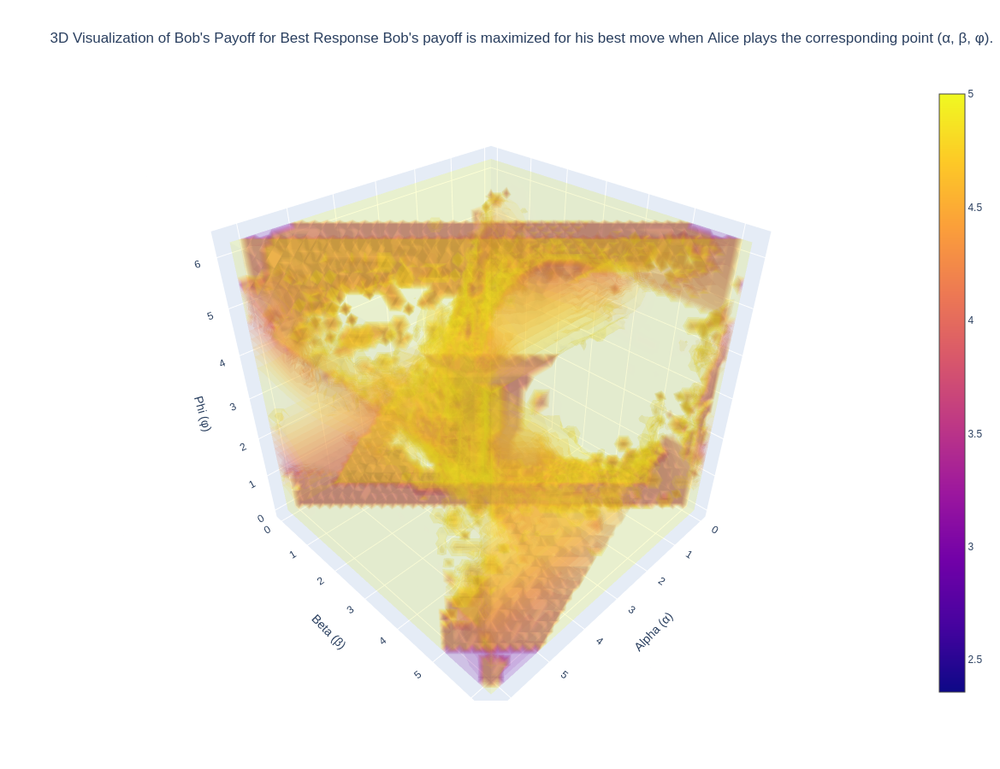

In [85]:
import numpy as np
import plotly.graph_objects as go

# Define the parameter grid for evaluation
alpha, beta, phi = np.mgrid[0:2*np.pi:40j, 0:2*np.pi:40j, 0:2*np.pi:40j]  # Adjusted resolution for better visualization

# Function to evaluate the best response
def evaluate_best_response(a, b, p):
    """
    Wrapper function to call the best_response with the parameters.
    """
    params = [a, b, p]
    result = best_response(params)  # Assumes best_response returns the optimized response
    return -result.fun  # Assuming you want to visualize the negative payoff

# Evaluate best_response over the grid
values = np.array([evaluate_best_response(a, b, p) for a, b, p in zip(alpha.flatten(), beta.flatten(), phi.flatten())])
values = values.reshape(alpha.shape)  # Reshape to match the grid dimensions

# Plotting the 3D volume
fig = go.Figure(data=go.Volume(
    x=alpha.flatten(),
    y=beta.flatten(),
    z=phi.flatten(),
    value=values.flatten(),
    isomin=np.min(values),
    isomax=np.max(values),
    opacity=0.1,  # Transparency to visualize internal structures
    surface_count=17  # Number of surfaces to render
))

# Update layout for better visualization and clear axis labels
fig.update_layout(
    scene=dict(
        xaxis_title='Alpha (α)',
        yaxis_title='Beta (β)',
        zaxis_title='Phi (φ)',
    ),
    title=(
        "3D Visualization of Bob's Payoff for Best Response\n"
        "Bob's payoff is maximized for his best move when Alice plays the corresponding point (α, β, φ)."
    ),
    height=900  # Increased vertical space for better display
)

# Display the plot
fig.show()
